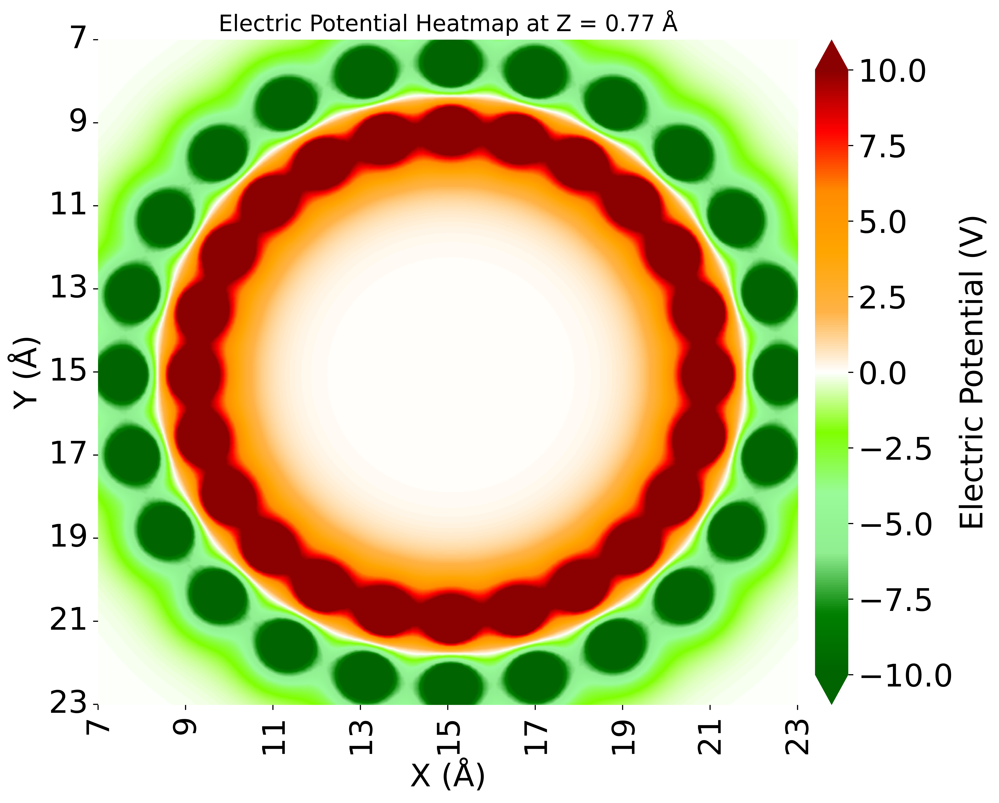

In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import griddata

# Load the complete dataset from a CSV file
file_path = 'AA/potential_data.csv'  # Replace with your file path
full_df = pd.read_csv(file_path)

# Filter for a specific Z value
z_value = 0.77
filtered_df = full_df[full_df["Z"] == z_value]

# Prepare data for interpolation
x = filtered_df["X"]
y = filtered_df["Y"]
potential = filtered_df["Potential"]

# Create a grid for the heatmap
grid_x, grid_y = np.mgrid[min(x):max(x):1000j, min(y):max(y):1000j]

# Interpolate data onto the grid with linear interpolation
grid_potential = griddata((x, y), potential, (grid_x, grid_y), method='linear')

lim = [10, 0.5, .2, 0.1 , 0.01]
#lim = [20, 4, .2, 0.1 , 0.01]
# Define custom color palette
colors = [
    (-lim[0], "darkgreen"),
    (-lim[1], "green"),
    (-lim[2], "lightgreen"),
    (-lim[3], "#98FB98"),#PaleGreen
    (-lim[4], "#7FFF00"),#Lemonyellow
    #(-lim[3], "#98FB98"), #PaleGreen
    #(-lim[4], "#F0FFF0"),#honey dew, very pale green
    (0, "white"),
    (lim[4], "#FFB347"),
    (lim[3], "orange"),
    (lim[2], "darkorange"),
    (lim[1], "red"),
    (lim[0], "darkred"),
]
cmap = LinearSegmentedColormap.from_list("custom_palette", [color[1] for color in colors])

# Normalize color range
vmin, vmax = -lim[0], lim[0]

# Plot the heatmap using seaborn
plt.figure(figsize=(10, 8), dpi=800)

# Define font sizes for labels
font_size_x = 22
font_size_y = 22
font_size_cbar = 22

ax = sns.heatmap(
    grid_potential,
    cmap=cmap,
    vmin=vmin,
    vmax=vmax,
    cbar_kws={
        'label': 'Potential (V)',
        'shrink': 1.0,
        'pad': 0.02,
        'extend': 'both'
    }
)

# Set x and y ticks with a step of 2 Å (Angstrom)
x_ticks = np.arange(int(np.floor(min(x))), int(np.ceil(max(x))) + 1, 2)
y_ticks = np.arange(int(np.floor(min(y))), int(np.ceil(max(y))) + 1, 2)

ax.set_xticks(np.linspace(0, grid_x.shape[1] - 1, len(x_ticks)))
ax.set_xticklabels([f"{tick}" for tick in x_ticks],rotation=450, fontsize=font_size_x)
ax.set_yticks(np.linspace(0, grid_y.shape[0] - 1, len(y_ticks)))
ax.set_yticklabels([f"{tick}" for tick in y_ticks], fontsize=font_size_y)

# Add labels and title
plt.title(f"Electric Potential Heatmap at Z = {z_value} Å", fontsize=16)
plt.xlabel("X (Å)", fontsize=font_size_x)
plt.ylabel("Y (Å)", fontsize=font_size_y)

# Customize colorbar font size
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=font_size_cbar)
cbar.set_label('Electric Potential (V)', fontsize=font_size_y) 
plt.tight_layout()
plt.show()


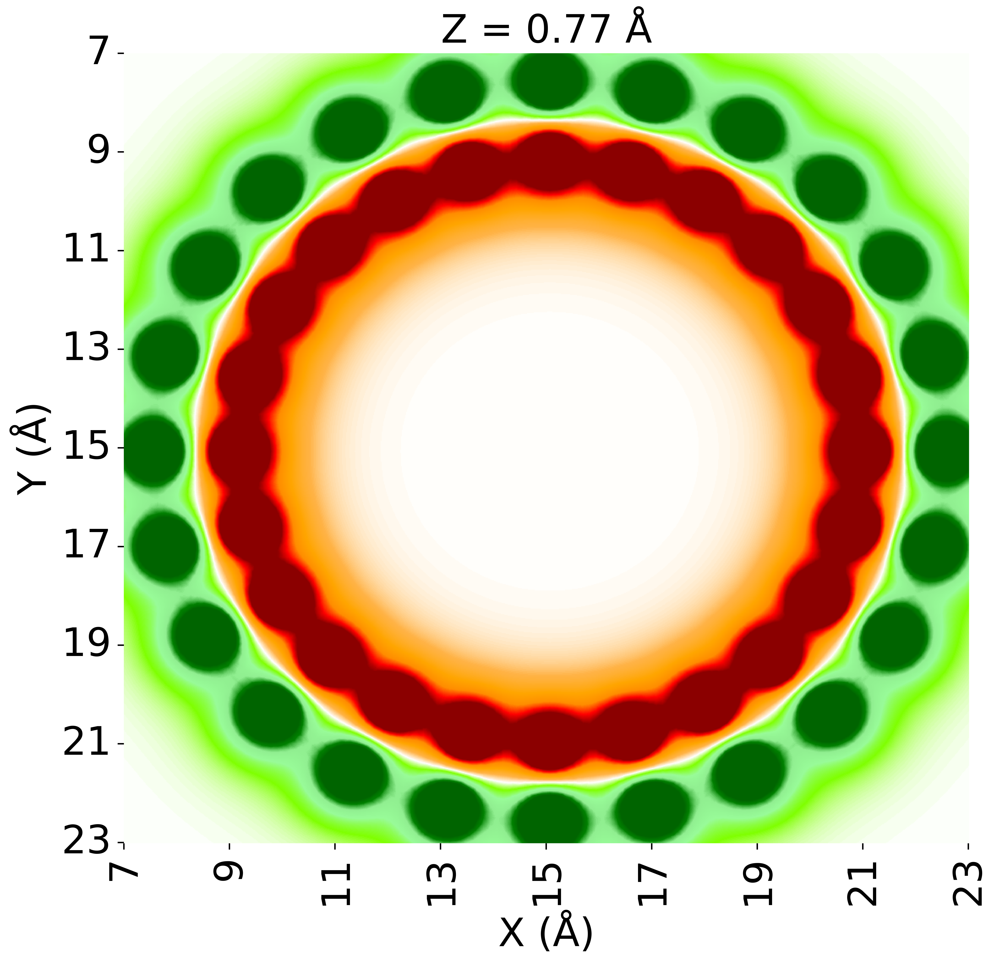

In [19]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import griddata

# Load the complete dataset from a CSV file
file_path = 'AA/potential_data.csv'  # Replace with your file path
full_df = pd.read_csv(file_path)

# Filter for a specific Z value
z_value = 0.77
filtered_df = full_df[full_df["Z"] == z_value]

# Prepare data for interpolation
x = filtered_df["X"]
y = filtered_df["Y"]
potential = filtered_df["Potential"]

# Create a grid for the heatmap
grid_x, grid_y = np.mgrid[min(x):max(x):1000j, min(y):max(y):1000j]

# Interpolate data onto the grid with linear interpolation
grid_potential = griddata((x, y), potential, (grid_x, grid_y), method='linear')

lim = [10, 0.5, .2, 0.1 , 0.01]

# Define custom color palette
colors = [
    (-lim[0], "darkgreen"),
    (-lim[1], "green"),
    (-lim[2], "lightgreen"),
    (-lim[3], "#98FB98"), # PaleGreen
    (-lim[4], "#7FFF00"), # Lemonyellow
    (0, "white"),
    (lim[4], "#FFB347"),
    (lim[3], "orange"),
    (lim[2], "darkorange"),
    (lim[1], "red"),
    (lim[0], "darkred"),
]
cmap_icc = LinearSegmentedColormap.from_list("custom_palette", [color[1] for color in colors])

# Normalize color range
vmin, vmax = -lim[0], lim[0]

# Plot the heatmap using seaborn
plt.figure(figsize=(8.5, 8), dpi=800)

# Define font sizes for labels
font_size_x = 22
font_size_y = 22

ax = sns.heatmap(
    grid_potential,
    cmap=cmap_icc,
    vmin=vmin,
    vmax=vmax,
    cbar=False  # Disable colorbar
)

# Set x and y ticks with a step of 2 Å (Angstrom)
x_ticks = np.arange(int(np.floor(min(x))), int(np.ceil(max(x))) + 1, 2)
y_ticks = np.arange(int(np.floor(min(y))), int(np.ceil(max(y))) + 1, 2)

ax.set_xticks(np.linspace(0, grid_x.shape[1] - 1, len(x_ticks)))
ax.set_xticklabels([f"{tick}" for tick in x_ticks], rotation=450, fontsize=font_size_x)
ax.set_yticks(np.linspace(0, grid_y.shape[0] - 1, len(y_ticks)))
ax.set_yticklabels([f"{tick}" for tick in y_ticks], fontsize=font_size_y)

# Add labels and title
plt.title(f"Z = {z_value} Å", fontsize=22)
plt.xlabel("X (Å)", fontsize=font_size_x)
plt.ylabel("Y (Å)", fontsize=font_size_y)
# Save the figure before displaying it
plt.savefig("figures/AA_z0_heatmap.png", dpi=800, bbox_inches="tight")
plt.show()


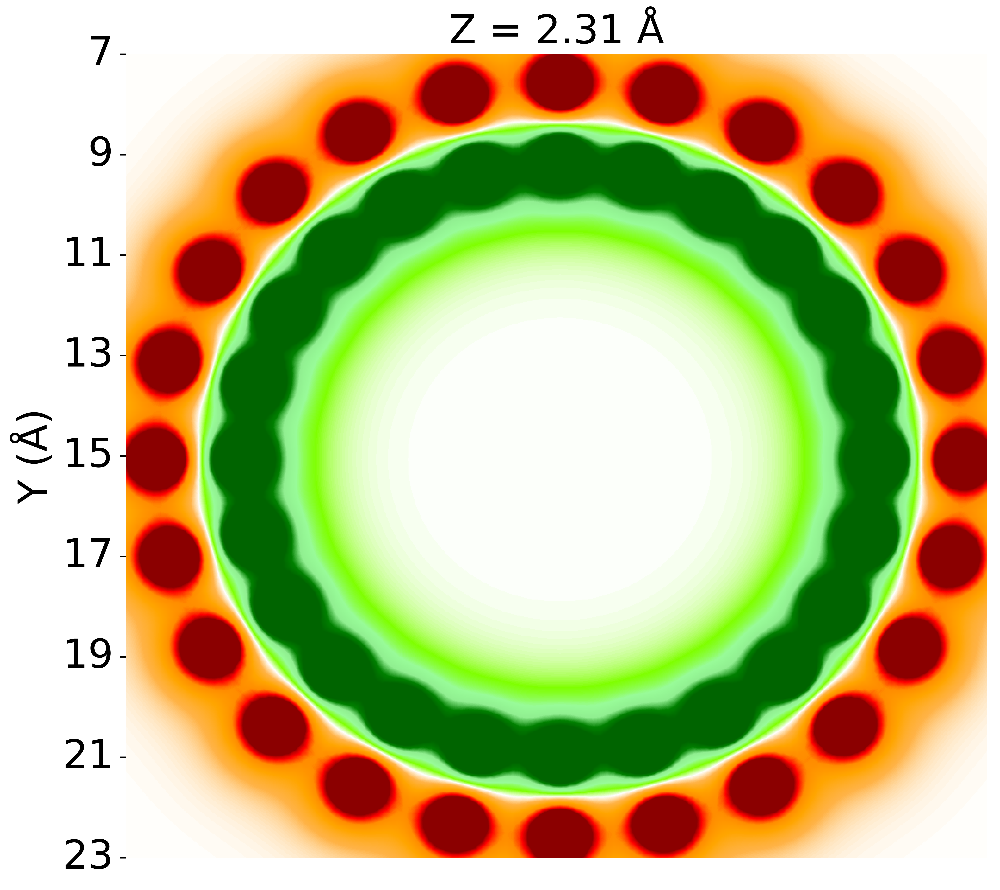

In [22]:
#no xticks
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import griddata

# Load the complete dataset from a CSV file
file_path = 'AA/potential_data.csv'  # Replace with your file path
full_df = pd.read_csv(file_path)

# Filter for a specific Z value
z_value = 2.31
filtered_df = full_df[full_df["Z"] == z_value]

# Prepare data for interpolation
x = filtered_df["X"]
y = filtered_df["Y"]
potential = filtered_df["Potential"]

# Create a grid for the heatmap
grid_x, grid_y = np.mgrid[min(x):max(x):1000j, min(y):max(y):1000j]

# Interpolate data onto the grid with linear interpolation
grid_potential = griddata((x, y), potential, (grid_x, grid_y), method='linear')

lim = [10, 0.5, .2, 0.1 , 0.01]

# Define custom color palette
colors = [
    (-lim[0], "darkgreen"),
    (-lim[1], "green"),
    (-lim[2], "lightgreen"),
    (-lim[3], "#98FB98"), # PaleGreen
    (-lim[4], "#7FFF00"), # Lemonyellow
    (0, "white"),
    (lim[4], "#FFB347"),
    (lim[3], "orange"),
    (lim[2], "darkorange"),
    (lim[1], "red"),
    (lim[0], "darkred"),
]
cmap_icc = LinearSegmentedColormap.from_list("custom_palette", [color[1] for color in colors])

# Normalize color range
vmin, vmax = -lim[0], lim[0]

# Plot the heatmap using seaborn
plt.figure(figsize=(8.5, 8), dpi=800)

# Define font sizes for labels
font_size_y = 22

ax = sns.heatmap(
    grid_potential,
    cmap=cmap_icc,
    vmin=vmin,
    vmax=vmax,
    cbar=False  # Disable colorbar
)

# Remove x-ticks
ax.set_xticks([])
ax.set_xticklabels([])

# Keep y-ticks
y_ticks = np.arange(int(np.floor(min(y))), int(np.ceil(max(y))) + 1, 2)
ax.set_yticks(np.linspace(0, grid_y.shape[0] - 1, len(y_ticks)))
ax.set_yticklabels([f"{tick}" for tick in y_ticks], fontsize=font_size_y)

# Add labels and title
plt.title(f"Z = {z_value} Å", fontsize=22)
plt.xlabel("")  # Remove x-axis label
plt.ylabel("Y (Å)", fontsize=font_size_y)

# Save the figure before displaying it
plt.savefig("figures/AA_z1_heatmap.png", dpi=800, bbox_inches="tight")

# Show the figure
plt.show()


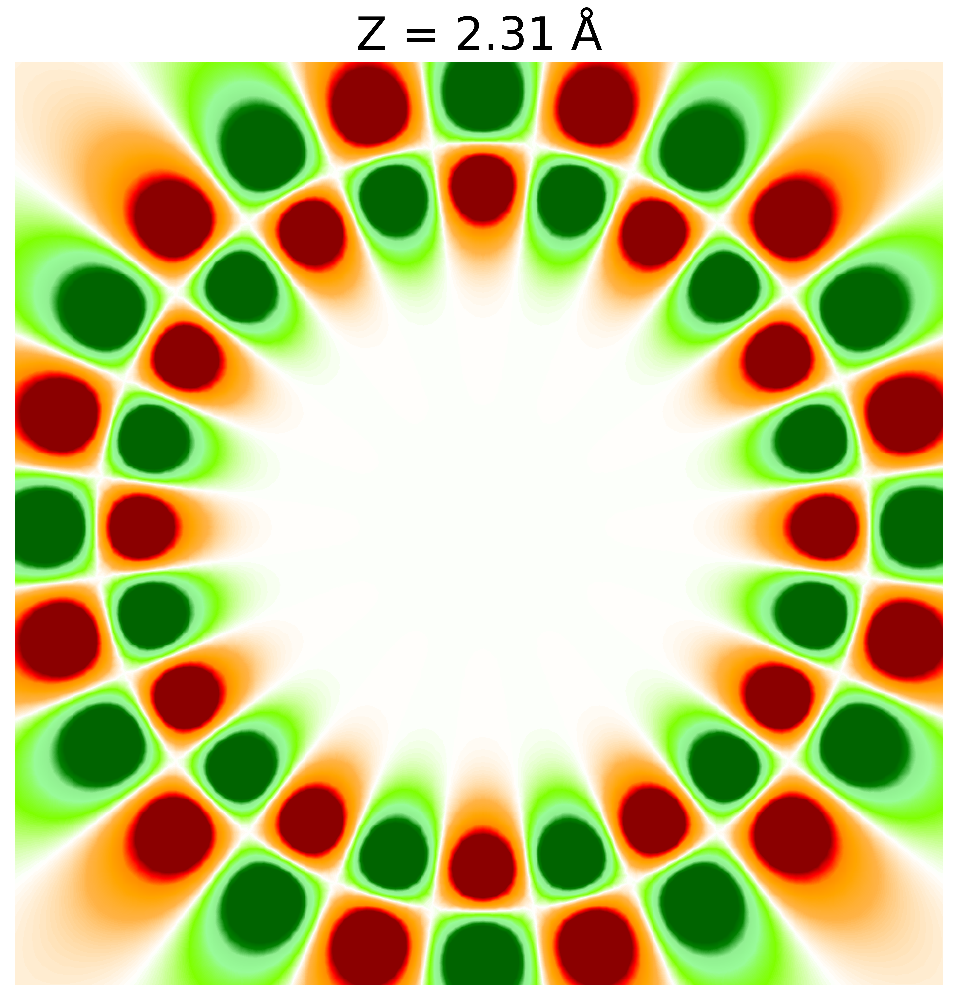

In [24]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import griddata

# Load the complete dataset from a CSV file
file_path = 'AR/potential_data.csv'  # Replace with your file path
full_df = pd.read_csv(file_path)

# Filter for a specific Z value
z_value = 2.31
filtered_df = full_df[full_df["Z"] == z_value]

# Prepare data for interpolation
x = filtered_df["X"]
y = filtered_df["Y"]
potential = filtered_df["Potential"]

# Create a grid for the heatmap
grid_x, grid_y = np.mgrid[min(x):max(x):1000j, min(y):max(y):1000j]

# Interpolate data onto the grid with linear interpolation
grid_potential = griddata((x, y), potential, (grid_x, grid_y), method='linear')

lim = [10, 0.5, .2, 0.1 , 0.01]

# Define custom color palette
colors = [
    (-lim[0], "darkgreen"),
    (-lim[1], "green"),
    (-lim[2], "lightgreen"),
    (-lim[3], "#98FB98"), # PaleGreen
    (-lim[4], "#7FFF00"), # Lemonyellow
    (0, "white"),
    (lim[4], "#FFB347"),
    (lim[3], "orange"),
    (lim[2], "darkorange"),
    (lim[1], "red"),
    (lim[0], "darkred"),
]
cmap_icc = LinearSegmentedColormap.from_list("custom_palette", [color[1] for color in colors])

# Normalize color range
vmin, vmax = -lim[0], lim[0]

# Plot the heatmap using seaborn
plt.figure(figsize=(8, 8), dpi=800)

ax = sns.heatmap(
    grid_potential,
    cmap=cmap_icc,
    vmin=vmin,
    vmax=vmax,
    cbar=False,  # Disable colorbar
    xticklabels=False,  # Remove x-tick labels
    yticklabels=False   # Remove y-tick labels
)

# Remove x-ticks and y-ticks completely
ax.set_xticks([])
ax.set_yticks([])

# Remove x-axis and y-axis labels
ax.set_xlabel("")
ax.set_ylabel("")

# Add only the title
plt.title(f"Z = {z_value} Å", fontsize=22)

# Save the figure before displaying it
#plt.savefig("figures/AR_z1_heatmap.png"", dpi=800, bbox_inches="tight")

# Show the figure
plt.show()


ValueError: min() iterable argument is empty

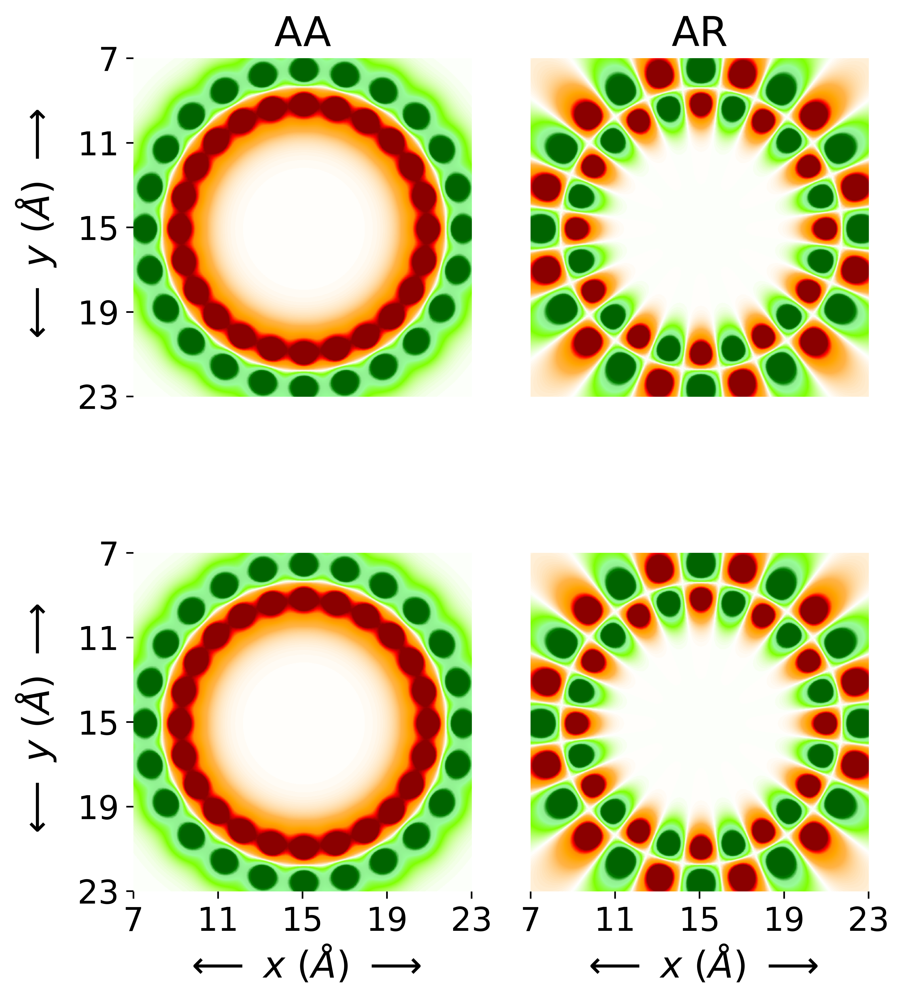

In [76]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import griddata
import matplotlib.gridspec as gridspec

# Folders to process
folders = ["AA", "AR", "AAR", "Inner", "Outer"]

# Z values to select (bottom: 0.77, top: 2.31)
z_values = [2.31, 0.77]  # First row (top), second row (bottom)
#z_values = [0.55, 0.99]

lim = [10, 0.5, .2, 0.1 , 0.01]

#new experimental limit
#lim = [1e2, 1e0, 1e-2, 1e-4, 1e-8]

# Define custom color palette
colors = [
    (-lim[0], "darkgreen"),
    (-lim[1], "green"),
    (-lim[2], "lightgreen"),
    (-lim[3], "#98FB98"), # PaleGreen
    (-lim[4], "#7FFF00"), # Lemonyellow
    (0, "white"),
    (lim[4], "#FFB347"),
    (lim[3], "orange"),
    (lim[2], "darkorange"),
    (lim[1], "red"),
    (lim[0], "darkred"),
]

cmap_icc = LinearSegmentedColormap.from_list("custom_palette", [color[1] for color in colors])

# Normalize color range
vmin, vmax = -lim[0], lim[0]

# Create figure with GridSpec (ensuring equal subplot sizes)
fig = plt.figure(figsize=(18, 8), dpi=800)  # Adjusted figure width for better aspect ratio
gs = gridspec.GridSpec(2, 6, width_ratios=[1, 1, 1, 1, 1, 0.2], height_ratios=[1, 1])  # Reduced colorbar width

# Reduce gap between Z = 0.77 and Z = 2.31
#plt.subplots_adjust(wspace=0.10, hspace=0.02)  # Tight spacing

# Axes storage
axes = []

for col, folder in enumerate(folders):
    # Load dataset from the folder
    file_path = f"{folder}/potential_data.csv"
    full_df = pd.read_csv(file_path)

    for row, z_value in enumerate(z_values):
        # Filter data for the specific Z value
        filtered_df = full_df[full_df["Z"] == z_value]

        # Prepare data for interpolation
        x = filtered_df["X"]
        y = filtered_df["Y"]
        potential = filtered_df["Potential"]

        # Create a grid for the heatmap
        grid_x, grid_y = np.mgrid[min(x):max(x):1000j, min(y):max(y):1000j]

        # Interpolate data onto the grid
        grid_potential = griddata((x, y), potential, (grid_x, grid_y), method='linear')

        # Select the current axis
        ax = fig.add_subplot(gs[row, col])  # No extra space for Z labels
        axes.append(ax)

        # Plot heatmap without individual colorbars
        img = sns.heatmap(
            grid_potential,
            cmap=cmap_icc,
            vmin=vmin,
            vmax=vmax,
            cbar=False,  # Disable individual colorbars
            xticklabels=False,  # Remove x-tick labels
            yticklabels=False,  # Remove y-tick labels
            square=True,  # Ensures equal width and height for each subplot
            ax=ax
        )

        # Customize axes
        if col == 0:  # Show Y-axis label only once for "AA"
            y_ticks = np.arange(int(np.floor(min(y))), int(np.ceil(max(y))) + 1, 4)
            ax.set_yticks(np.linspace(0, grid_y.shape[0] - 1, len(y_ticks)))
            ax.set_yticklabels([f"{tick}" for tick in y_ticks], fontsize=16)

            if row == 0:  # Only add Y-axis label once
                ax.set_ylabel(r"$\longleftarrow$ $y$ (${\AA}$) $\longrightarrow$", fontsize=18, labelpad=10)  # Adjust label spacing
            else:
                ax.set_ylabel(r"$\longleftarrow$ $y$ (${\AA}$) $\longrightarrow$", fontsize=18, labelpad=10)  # Adjust label spacing
                #ax.set_ylabel("")
        else:
            ax.set_yticks([])
            ax.set_ylabel("")

        if row == 1:  # Show x-ticks & labels only for z = 0.77
            x_ticks = np.arange(int(np.floor(min(x))), int(np.ceil(max(x))) + 1, 4)
            ax.set_xticks(np.linspace(0, grid_x.shape[1] - 1, len(x_ticks)))
            ax.set_xticklabels([f"{tick}" for tick in x_ticks], fontsize=16)
            ax.set_xlabel(r"$\longleftarrow$ $x$ (${\AA}$) $\longrightarrow$", fontsize=18)
        else:
            ax.set_xticks([])
            ax.set_xlabel("")

        # Set title for each column
        if row == 0:
            ax.set_title(folder, fontsize=20)

# Create a separate colorbar on the right side with reduced width
cbar_ax = fig.add_subplot(gs[:, -1])  # Use the last column for the colorbar
cb = fig.colorbar(img.collections[0], cax=cbar_ax)
cb.ax.tick_params(labelsize=16)
cb.set_label("Electric Potential (V)", fontsize=18)

# Reduce white space between subplots while maintaining clarity
plt.subplots_adjust(wspace=0.15, hspace=-0.25)  # Tight spacing

# Save the figure
plt.savefig("panel_heatmap_alternate_layer.png", dpi=800, bbox_inches="tight")

# Show the figure
plt.show()


In [45]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, FuncNorm
from scipy.interpolate import griddata
import matplotlib.gridspec as gridspec

# Folders to process
folders = ["AA", "AR", "AAR", "Inner", "Outer"]

# Z values to select (bottom: 0.77, top: 2.31)
z_values = [2.31, 0.77]  # First row (top), second row (bottom)

# Logarithmic normalization function
def log_scale(val):
    return np.sign(val) * np.log1p(abs(val))

# Define color limits dynamically using percentiles
min_potential = -1500  # Set reasonable min limit based on analysis
max_potential = 1500   # Set reasonable max limit based on analysis

log_norm = FuncNorm(
    (lambda x: log_scale(x), lambda x: np.expm1(abs(x)) * np.sign(x)),
    vmin=min_potential, vmax=max_potential
)

# Define custom colormap with log scaling
cmap_log = LinearSegmentedColormap.from_list("log_colormap", [
    (0.0, "darkgreen"),
    (0.2, "green"),
    (0.4, "lightgreen"),
    (0.5, "white"),  # Neutral zero potential
    (0.6, "orange"),
    (0.8, "red"),
    (1.0, "darkred"),
])

# Create figure with GridSpec (ensuring equal subplot sizes)
fig = plt.figure(figsize=(18, 8), dpi=800)
gs = gridspec.GridSpec(2, 6, width_ratios=[1, 1, 1, 1, 1, 0.2], height_ratios=[1, 1])

# Axes storage
axes = []

for col, folder in enumerate(folders):
    # Load dataset from the folder
    file_path = f"{folder}/potential_data.csv"
    full_df = pd.read_csv(file_path)

    for row, z_value in enumerate(z_values):
        # Filter data for the specific Z value
        filtered_df = full_df[full_df["Z"] == z_value]

        # Prepare data for interpolation
        x = filtered_df["X"]
        y = filtered_df["Y"]
        potential = filtered_df["Potential"]

        # Create a grid for the heatmap
        grid_x, grid_y = np.mgrid[min(x):max(x):1000j, min(y):max(y):1000j]

        # Interpolate data onto the grid
        grid_potential = griddata((x, y), potential, (grid_x, grid_y), method='linear')

        # Select the current axis
        ax = fig.add_subplot(gs[row, col])
        axes.append(ax)

        # Plot heatmap with log scaling
        img = sns.heatmap(
            grid_potential,
            cmap=cmap_log,
            norm=log_norm,
            cbar=False,  # Disable individual colorbars
            xticklabels=False,  # Remove x-tick labels
            yticklabels=False,  # Remove y-tick labels
            square=True,  # Ensures equal width and height for each subplot
            ax=ax
        )

        # Customize axes
        if col == 0:
            y_ticks = np.arange(int(np.floor(min(y))), int(np.ceil(max(y))) + 1, 2)
            ax.set_yticks(np.linspace(0, grid_y.shape[0] - 1, len(y_ticks)))
            ax.set_yticklabels([f"{tick}" for tick in y_ticks], fontsize=16)
            if row == 0:
                ax.set_ylabel("Y (Å)", fontsize=18, labelpad=10)
        else:
            ax.set_yticks([])

        if row == 1:
            x_ticks = np.arange(int(np.floor(min(x))), int(np.ceil(max(x))) + 1, 2)
            ax.set_xticks(np.linspace(0, grid_x.shape[1] - 1, len(x_ticks)))
            ax.set_xticklabels([f"{tick}" for tick in x_ticks], fontsize=16)
            ax.set_xlabel("X (Å)", fontsize=18)
        else:
            ax.set_xticks([])

        if row == 0:
            ax.set_title(folder, fontsize=20)

# Create a separate colorbar on the right side with reduced width
cbar_ax = fig.add_subplot(gs[:, -1])
cb = fig.colorbar(img.collections[0], cax=cbar_ax)
cb.ax.tick_params(labelsize=16)
cb.set_label("Electric Potential (V)", fontsize=18)

# Reduce white space between subplots while maintaining clarity
plt.subplots_adjust(wspace=0.10, hspace=0.05)

# Save the figure
#plt.savefig("panel_heatmap_log_scaled.png", dpi=800, bbox_inches="tight")

# Show the figure
plt.show()
